In [1]:
using Pkg
Pkg.activate("C:/Users/lisah/Documents/Repos/ma-code")
include("c:/Users/lisah/Documents/Repos/ma-code/src/src.jl")
using .Src, Plots, Plots.Measures

  Activating project at `C:\Users\lisah\Documents\Repos\ma-code`


In [2]:
function save_all_fig(r, rf, path, pt::String)
    savefig(r.plot_mles[1], joinpath(path, "$(pt)_mle_restart_a.pdf"))
    if length(r.plot_mles) > 1
        savefig(r.plot_mles[2], joinpath(path, "$(pt)_mle_restart_m.pdf"))
    end
    savefig(r.plot_losses, joinpath(path, "$(pt)_losses.pdf"))
    if length(r.gaussian_surface) > 1
        savefig(r.gaussian_surface[2], joinpath(path, "$(pt)_gaussian_surface_2.pdf"))
        savefig(r.gaussian_heatmap, joinpath(path, "$(pt)_gaussian_heatmap.pdf"))
        savefig(r.gaussian_surface[1], joinpath(path, "$(pt)_gaussian_surface_1.pdf"))
    else
        savefig(r.gaussian_surface, joinpath(path, "$(pt)_gaussian_surface_1.pdf"))
    end
    savefig(rf.trajectories, joinpath(path, "$(pt)_trajectories.pdf"))
    savefig(rf.sample_dens_n, joinpath(path, "$(pt)_dens_n.pdf"))
    savefig(rf.sample_dens_w, joinpath(path, "$(pt)_dens_w.pdf"))
end

save_all_fig (generic function with 1 method)

# Identifiability Analysis of Point in Parameter Region 2

p2 = [a,m,w0,n0] = [0.9,0.45,0.2,1.5]

In [59]:
# set true model parameters
a_true = 0.9 # at bifurcation point
m_true = 0.45
n0 = 1.5
w0 = 0.2
M = 100 # number of measurements
noise = 0.1

# create parameter object for trial
hprm = Hyperprm(w0, n0, a_true, m_true, M, noise);

## fixed time window, observe from t=0

In [4]:
# observation time window fixed
t_fixed = true

true

### infer a,m

In [5]:
# infer a,m parameter
prm_keys = [:a, :m];

In [6]:
# inverse uq and practical identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

(mle = [0.9227226276452445, 0.4617270682776604], plot_mles = Plots.Plot{Plots.GRBackend}[Plot{Plots.GRBackend() n=6}, Plot{Plots.GRBackend() n=6}], plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0 0.9997032389837959; 0.9997032389787819 1.0], cov = [0.0046801980799963325 0.002311218419255559; 0.002311218419243967 0.0011420248324516367], gaussian_heatmap = Plot{Plots.GRBackend() n=1}, gaussian_surface = Plots.Plot{Plots.GRBackend}[Plot{Plots.GRBackend() n=1}, Plot{Plots.GRBackend() n=1}])

In [7]:
# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true, m_true], hprm, t_fixed=t_fixed)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

In [8]:
r.cov

2×2 Matrix{Float64}:
 0.0046802   0.00231122
 0.00231122  0.00114202

In [9]:
r.cor

2×2 Matrix{Float64}:
 1.0       0.999703
 0.999703  1.0

The variance of the parameter estimates in the Gaussian approximation is very small, however they are highly correlated.

### analyze plots

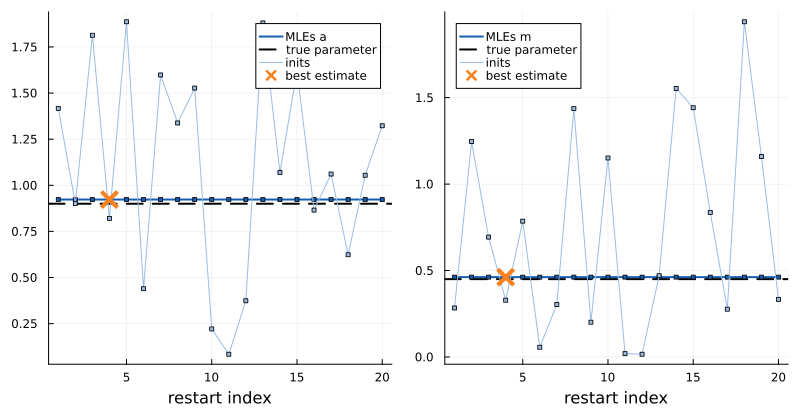

In [10]:
plot(r.plot_mles[1], r.plot_mles[2], layout=(1,2), size=(800,420), bottom_margin=5mm)

There appears to be a unique optimum, which is found.

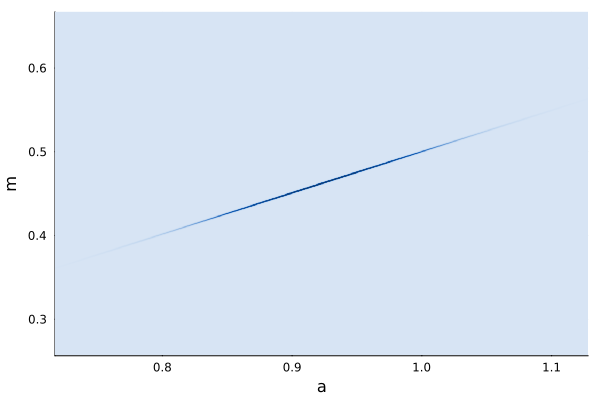

In [11]:
r.gaussian_heatmap

As suggested by the correlation, the Gaussian surface is very skewed. Given a sample of a, the value of m is more or less already determined apart from a small difference.

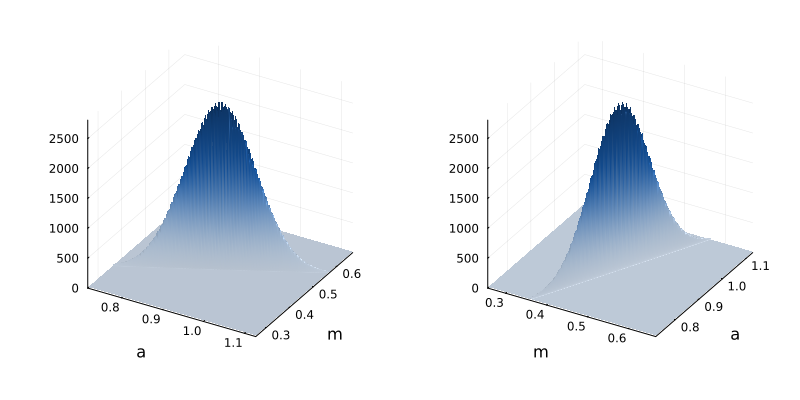

In [12]:
plot(r.gaussian_surface[1], r.gaussian_surface[2], layout=(1,2), size=(800,400))

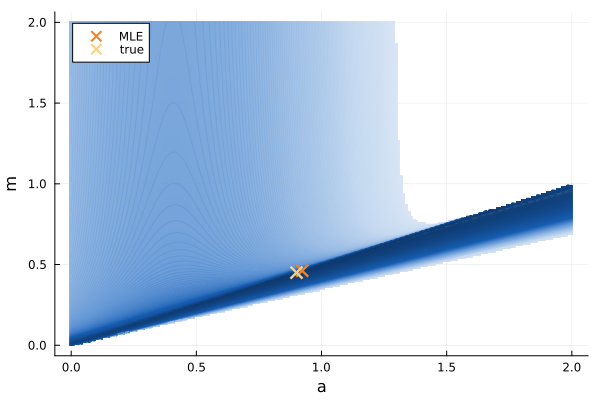

In [13]:
analyze_ll(r.mle, prm_keys, hprm, -1000, t_fixed=t_fixed)
scatter!([a_true],[m_true], markershape=:x, markerstrokewidth=3, markersize=6, color="#FAD080", label="true")

In [14]:
savefig("C:/Users/lisah/Documents/Repos/ma-code/plots/uq/pt2/am/pt2_ll.pdf")

"C:\\Users\\lisah\\Documents\\Repos\\ma-code\\plots\\uq\\pt2\\am\\pt2_ll.pdf"

The likelihood surface shows a very sharp edge along the line 2m=a. A unique optimum cannot visually be defined, and regarding the likelihood value, variation within one parameter could be compensated by variation in the other. This fits to the correlation value. Yet, the MLE is at the true value, so a unique optimum exists.

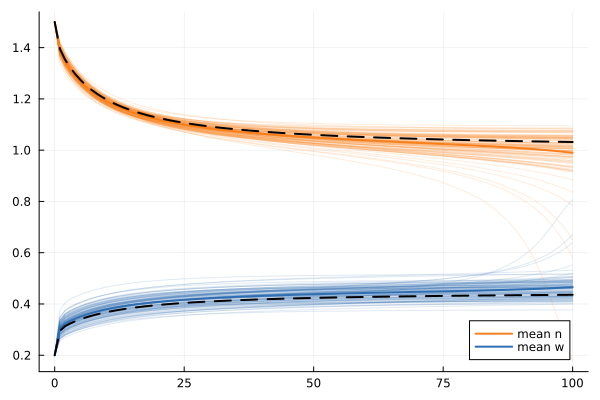

In [15]:
rf.trajectories

In [16]:
path = "C:/Users/lisah/Documents/Repos/ma-code/plots/uq/pt2/am/"
save_all_fig(r,rf,path,"pt2")

"C:\\Users\\lisah\\Documents\\Repos\\ma-code\\plots\\uq\\pt2\\am\\pt2_dens_w.pdf"

We see that some trajectories are off the true behaviour of the system and drift away at later time steps. This is caused by the proximity to the bifurcation. Independently of the quality of the parameter estimates, this is expected, as a small variance in parameters at the bifurcation point leads to different convergence behaviour by definition.

Conclusion: Due to the high correlation between the parameters, it does not make sense to both infer a and m and we should stick to just inferring one significant parameter, although the estimate is correct.

### infer a

In [45]:
prm_keys= [:a];

In [46]:
# inverse uq and practica identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true, m_true], hprm, t_fixed=t_fixed, t_pt_sample_dens=98)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

In [47]:
r.plot_mles

1-element Vector{Plots.Plot{Plots.GRBackend}}:
 Plot{Plots.GRBackend() n=6}

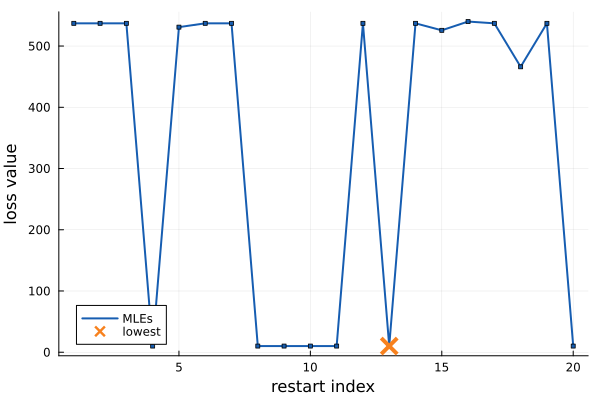

In [48]:
r.plot_losses

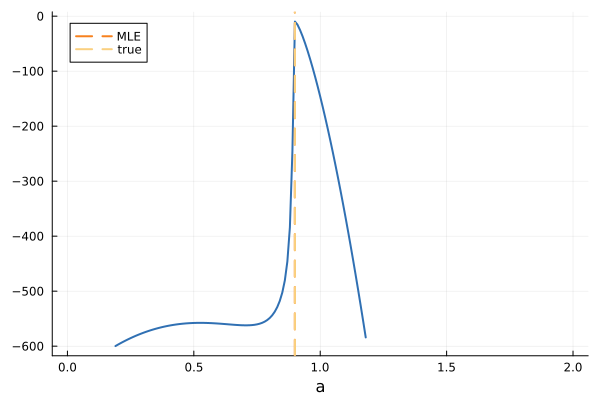

In [49]:
analyze_ll(r.mle,prm_keys, hprm, -600, t_fixed=t_fixed)
vline!([a_true], linestyle=:dash, linewidth=2, color=:"#FAD080", label="true")

In [50]:
savefig("C:/Users/lisah/Documents/Repos/ma-code/plots/uq/pt2/a/pt2_ll.pdf")

"C:\\Users\\lisah\\Documents\\Repos\\ma-code\\plots\\uq\\pt2\\a\\pt2_ll.pdf"

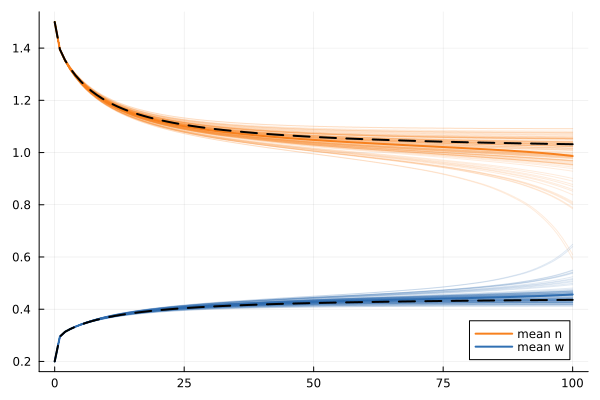

In [52]:
rf.trajectories

In [53]:
r.cov

1×1 Matrix{Float64}:
 3.026333172291585e-6

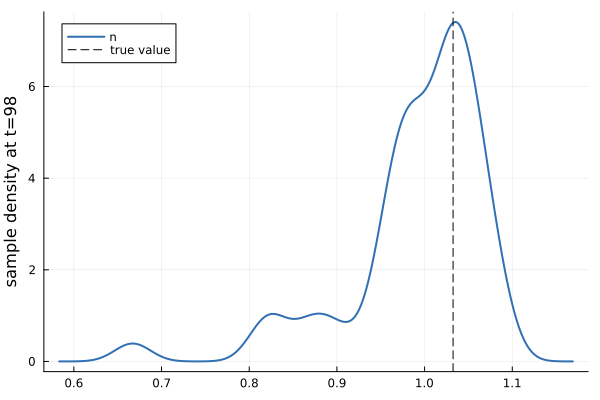

In [56]:
rf.sample_dens_n

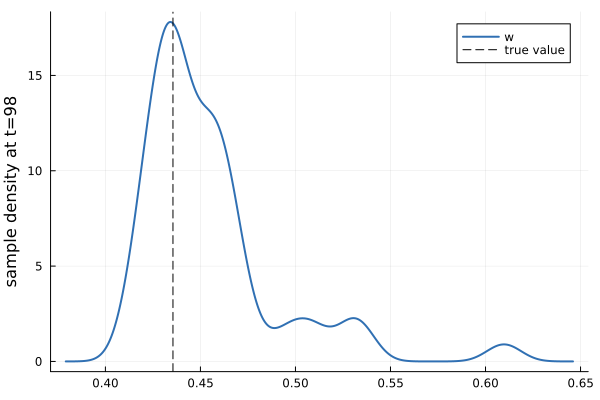

In [57]:
rf.sample_dens_w

In [58]:
path = "C:/Users/lisah/Documents/Repos/ma-code/plots/uq/pt2/a/"
save_all_fig(r,rf,path,"pt2")

"C:\\Users\\lisah\\Documents\\Repos\\ma-code\\plots\\uq\\pt2\\a\\pt2_dens_w.pdf"

## fixed time window, observe stable state only

In [60]:
# observation time window fixed
t_fixed = true

# observations in stable state only
obs_late = true
t_end = 200.0; # observe system for a longer time in this case

### infer a

In [61]:
prm_keys = [:a];

In [67]:
# inverse uq and practica identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed, obs_late=obs_late, t_end=t_end)

# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true], hprm, t_fixed=t_fixed, t_end=t_end)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

In [73]:
r.mle

1-element Vector{Float64}:
 0.9005542149108465

In [68]:
r.cov

1×1 Matrix{Float64}:
 2.359991880309427e-6

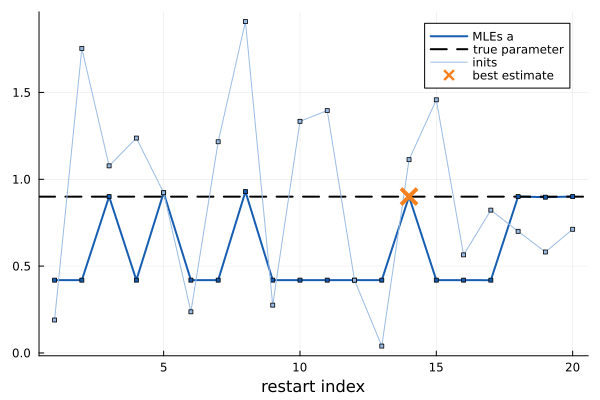

In [69]:
r.plot_mles[1]

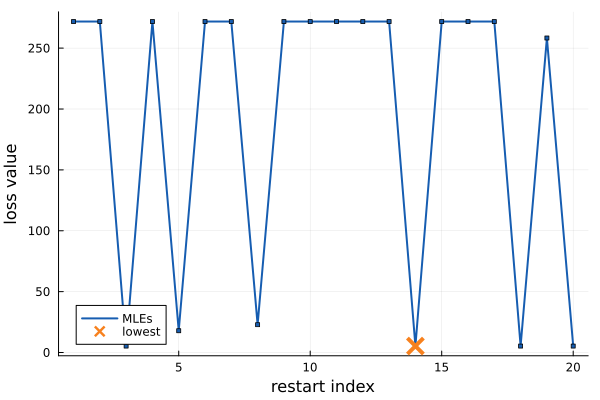

In [70]:
r.plot_losses

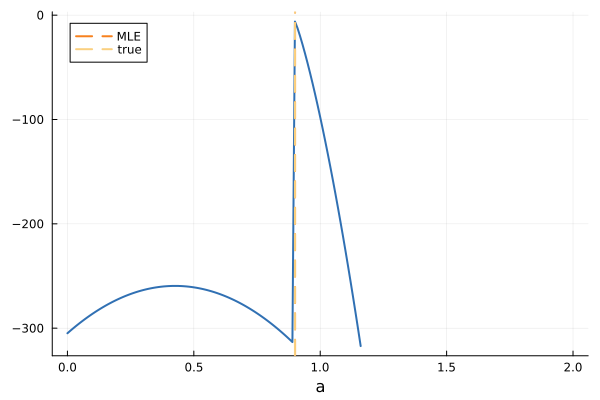

In [71]:
analyze_ll(r.mle, prm_keys, hprm,-330, t_fixed=t_fixed,obs_late=obs_late, t_end=200.0)
vline!([a_true], linestyle=:dash, linewidth=2, color=:"#FAD080", label="true")

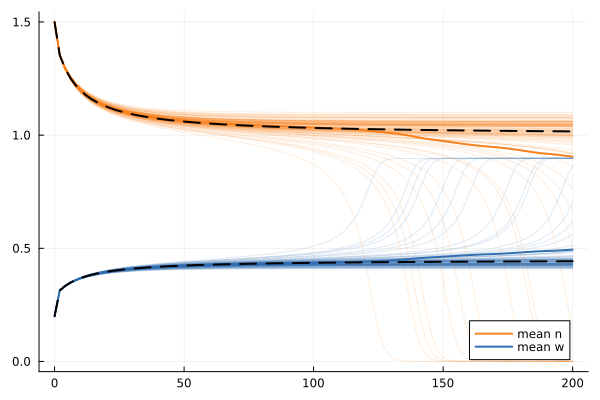

In [72]:
rf.trajectories

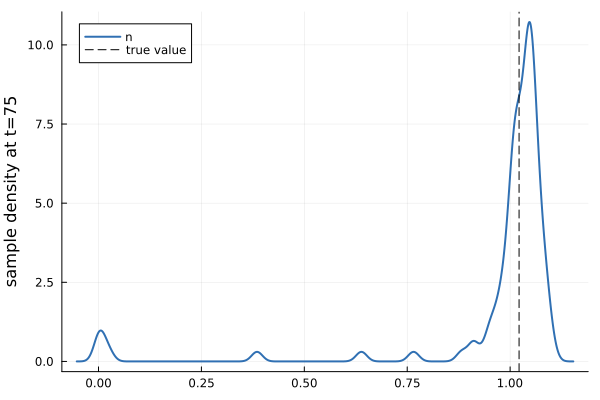

In [75]:
rf.sample_dens_n

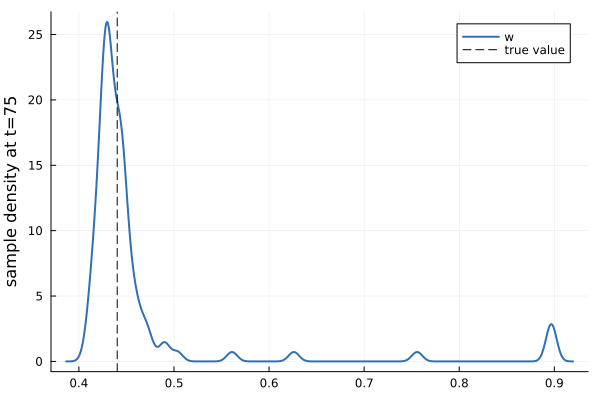

In [76]:
rf.sample_dens_w

results are comparable to t=0 case.